In [1]:
import numpy as np
import cv2 as cv
import glob
from tqdm import tqdm
import matplotlib.pyplot as plt

# Калибровка

In [2]:
chessboardSize = (8, 7)
frameSize = (2048, 1536)

In [3]:
# termination criteria
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

In [4]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((chessboardSize[0] * chessboardSize[1], 3), np.float32)
objp[:,:2] = np.mgrid[0:chessboardSize[0],0:chessboardSize[1]].T.reshape(-1,2)

objp = objp * 75

In [5]:
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpointsL = [] # 2d points in image plane.
imgpointsR = [] # 2d points in image plane.

In [6]:
imagesLeft = glob.glob('L/*.png')
imagesRight = glob.glob('R/*.png')

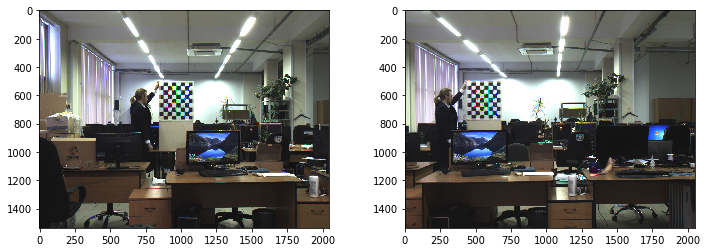

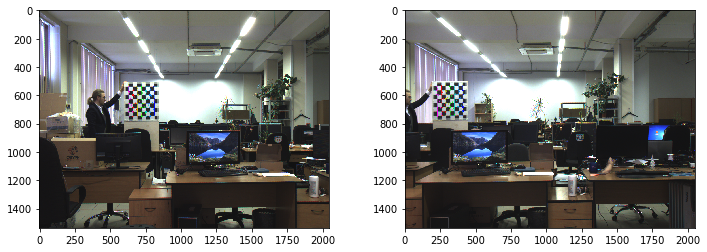

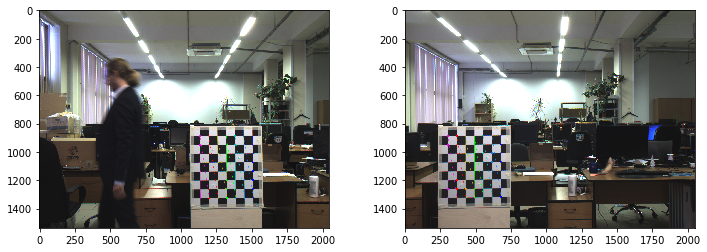

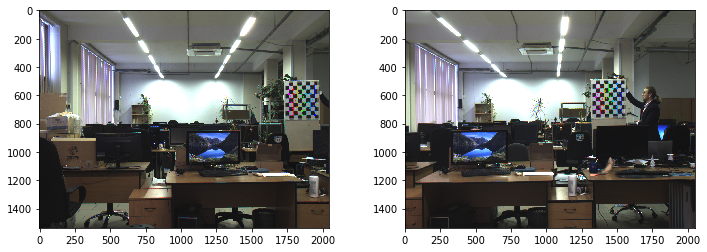

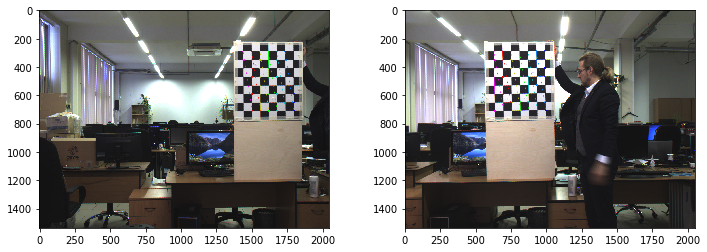

...

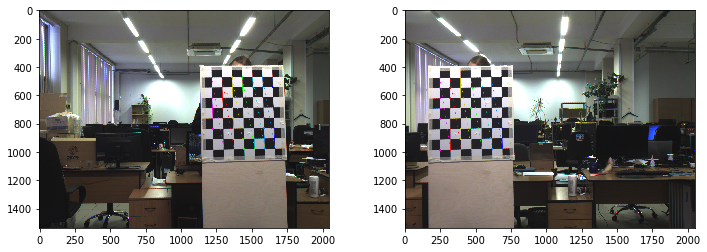

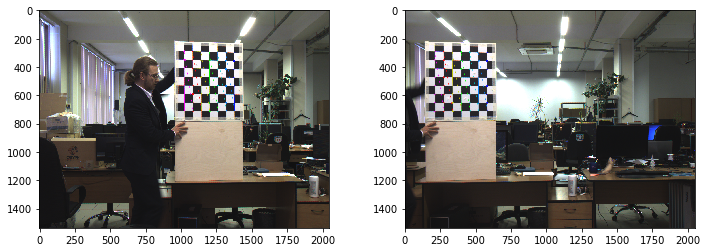

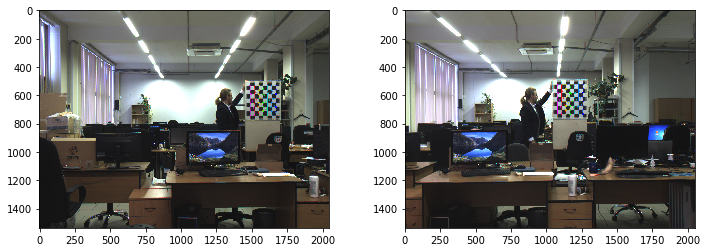

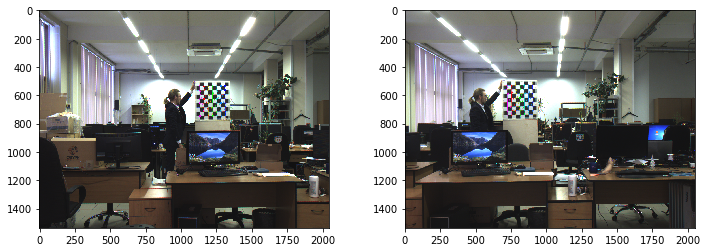

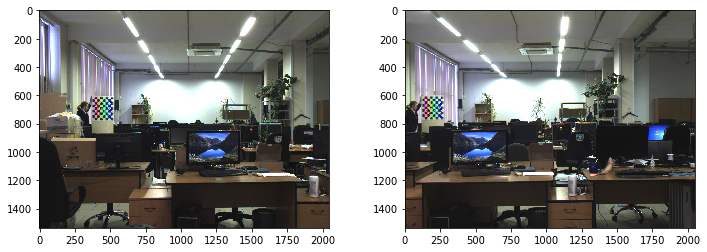

In [7]:
for imgLeft, imgRight in zip(imagesLeft, imagesRight):

    imgL = cv.imread(imgLeft)
    imgR = cv.imread(imgRight)
    grayL = cv.cvtColor(imgL, cv.COLOR_BGR2GRAY)
    grayR = cv.cvtColor(imgR, cv.COLOR_BGR2GRAY)

    # Find the chess board corners
    retL, cornersL = cv.findChessboardCorners(grayL, chessboardSize, None)
    retR, cornersR = cv.findChessboardCorners(grayR, chessboardSize, None)

    # If found, add object points, image points (after refining them)
    if retL and retR:
        objpoints.append(objp)

        cornersL = cv.cornerSubPix(grayL, cornersL, (11,11), (-1,-1), criteria)
        imgpointsL.append(cornersL)

        cornersR = cv.cornerSubPix(grayR, cornersR, (11,11), (-1,-1), criteria)
        imgpointsR.append(cornersR)
        
        rgbL = cv.cvtColor(imgL, cv.COLOR_BGR2RGB)
        rgbR = cv.cvtColor(imgR, cv.COLOR_BGR2RGB)

        # Draw and display the corners
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
        cv.drawChessboardCorners(rgbL, chessboardSize, cornersL, retL)
        ax1.imshow(rgbL)
        cv.drawChessboardCorners(rgbR, chessboardSize, cornersR, retR)
        ax2.imshow(rgbR)
        plt.show()
        cv.waitKey(1000)
        
cv.destroyAllWindows()

In [8]:
retL, cameraMatrixL, distL, rvecsL, tvecsL = cv.calibrateCamera(objpoints, imgpointsL, frameSize, None, None)
heightL, widthL, channelsL = imgL.shape
newCameraMatrixL, roi_L = cv.getOptimalNewCameraMatrix(cameraMatrixL, distL, (widthL, heightL), 1, (widthL, heightL))

retR, cameraMatrixR, distR, rvecsR, tvecsR = cv.calibrateCamera(objpoints, imgpointsR, frameSize, None, None)
heightR, widthR, channelsR = imgR.shape
newCameraMatrixR, roi_R = cv.getOptimalNewCameraMatrix(cameraMatrixR, distR, (widthR, heightR), 1, (widthR, heightR))

In [9]:
flags = 0
flags |= cv.CALIB_FIX_INTRINSIC
# Here we fix the intrinsic camara matrixes so that only Rot, Trns, Emat and Fmat are calculated.
# Hence intrinsic parameters are the same 

criteria_stereo = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# This step is performed to transformation between the two cameras and calculate Essential and Fundamenatl matrix
retStereo, newCameraMatrixL, distL, newCameraMatrixR, distR, rot, trans, essentialMatrix, fundamentalMatrix = cv.stereoCalibrate(
    objpoints, imgpointsL, imgpointsR, newCameraMatrixL, distL, newCameraMatrixR, distR, grayL.shape[::-1], criteria_stereo, flags)

In [10]:
rectifyScale = 1
rectL, rectR, projMatrixL, projMatrixR, Q, roi_L, roi_R = cv.stereoRectify(newCameraMatrixL, distL, newCameraMatrixR, distR, grayL.shape[::-1], rot, trans, rectifyScale,(0,0))

stereoMapL = cv.initUndistortRectifyMap(newCameraMatrixL, distL, rectL, projMatrixL, grayL.shape[::-1], cv.CV_16SC2)
stereoMapR = cv.initUndistortRectifyMap(newCameraMatrixR, distR, rectR, projMatrixR, grayR.shape[::-1], cv.CV_16SC2)

print("Saving parameters!")
cv_file = cv.FileStorage('stereoMap.xml', cv.FILE_STORAGE_WRITE)

cv_file.write('stereoMapL_x',stereoMapL[0])
cv_file.write('stereoMapL_y',stereoMapL[1])
cv_file.write('stereoMapR_x',stereoMapR[0])
cv_file.write('stereoMapR_y',stereoMapR[1])

cv_file.release()

Saving parameters!


# Тестирование качества калибровки

In [7]:
imgL = cv.imread(imagesLeft[0])
imgR = cv.imread(imagesRight[0])

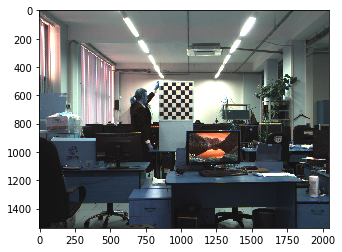

In [8]:
plt.imshow(imgL)

In [9]:
sift = cv.SIFT_create()

grayL = cv.cvtColor(imgL, cv.COLOR_BGR2RGB)
grayR = cv.cvtColor(imgR, cv.COLOR_BGR2RGB)

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(grayL, None)
kp2, des2 = sift.detectAndCompute(grayR, None)

In [10]:
def drawlines(img1, img2, lines, pts1, pts2):
    """img1 - image on witch we draw the epilines for the points in img2
       lines - corresponding epilines"""
    _, c, _ = img1.shape
    img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
    img2 = cv.cvtColor(img2, cv.COLOR_BGR2RGB)
    for r,pt1,pt2 in zip(lines, pts1, pts2):
        color = tuple(np.random.randint(0, 255, 3).tolist())
#         x0, y0 = map(int, [0, -r[0]/r[1]])
#         x1, y1 = map(int, [c, -(r[2] + r[0]*c/r[1])])
#         img1 = cv.line(img1, (x0, y0), (x1, y1), color, 2)
        img1 = cv.line(img1, (0, int(-r[2]/r[1])), (c, int((r[2] - r[0]*c)/r[1])), color, 2)
        img1 = cv.circle(img1, tuple(pt1), 5, color, -1)
        img2 = cv.circle(img2, tuple(pt2), 5, color, -1)
    return img1, img2

In [11]:
imgL.shape

(1536, 2048, 3)

In [12]:
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)

flann = cv.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1, des2, k=2)

good = []
pts1 = []
pts2 = []

In [13]:
for i, (m,n) in enumerate(matches):
    if m.distance < 0.8*n.distance:
        good.append(m)
        pts1.append(kp1[m.queryIdx].pt)
        pts2.append(kp2[m.trainIdx].pt)

pts1 = np.int32(pts1)
pts2 = np.int32(pts2)
F, mask = cv.findFundamentalMat(pts1, pts2, cv.FM_LMEDS)

# We select only inlier points
pts1 = pts1[mask.ravel() == 1]
pts2 = pts2[mask.ravel() == 1]

# Find epilines corresponding to points in right image (second image) and
# drawing its lines on left image
lines1 = cv.computeCorrespondEpilines(pts2.reshape(-1, 1, 2), 2 ,F)
lines1 = lines1.reshape(-1, 3)
img5, img6 = drawlines(imgL, imgR, lines1, pts1, pts2)

In [14]:
lines2 = cv.computeCorrespondEpilines(pts1.reshape(-1, 1, 2), 1, F)
lines2 = lines2.reshape(-1, 3)
img3, img4 = drawlines(imgR, imgL, lines2, pts2, pts1)

In [15]:
lines1

array([[-9.5569110e-03, -9.9995434e-01,  5.2065350e+02],
       [-9.6368324e-03, -9.9995357e-01,  5.2679877e+02],
       [-6.3595804e-03, -9.9997979e-01,  2.7481024e+02],
       ...,
       [-1.9026145e-02, -9.9981898e-01,  1.2487574e+03],
       [-1.9295055e-02, -9.9981385e-01,  1.2694346e+03],
       [-2.0827543e-02, -9.9978310e-01,  1.3872717e+03]], dtype=float32)

In [16]:
-9.5569110e-03

-0.009556911

In [17]:
-9.9995434e-01

-0.99995434

In [18]:
5.2065350e+02

520.6535

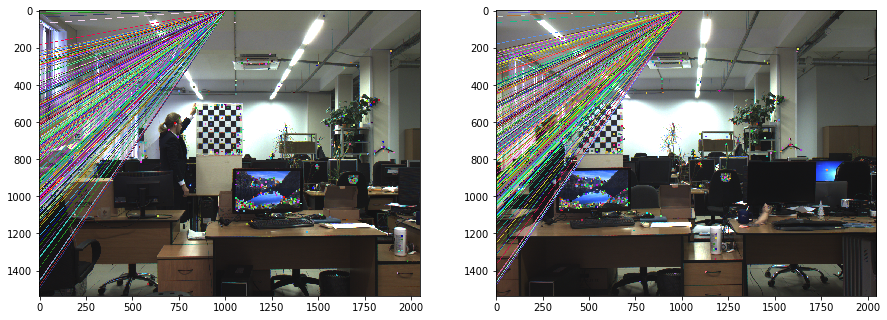

In [16]:
plt.figure(figsize=(15,15))
plt.subplot(121), plt.imshow(img5)
plt.subplot(122), plt.imshow(img3)
plt.show()

In [35]:
def extract_features_orb(image):
#     orb_extr = cv.SIFT_create(nfeatures=100)
#     kp, des = orb_extr.detectAndCompute(image, None)
    corners = cv.goodFeaturesToTrack(image, 400, 0.01, 10)
    brief = cv.DescriptorExtractor_create("BRIEF")
    kp, des = brief.compute(image, kp)
    return kp, des

In [36]:
def match_features_bf(des1, des2):
    bf = cv.BFMatcher_create()
    match = bf.knnMatch(des1, des2, k=2)   
    return match

In [37]:
n = 20
i = 0 
imgL = cv.imread(imagesLeft[0])
imgR = cv.imread(imagesRight[0])

imgL = cv.cvtColor(imgL, cv.COLOR_BGR2GRAY)
imgR = cv.cvtColor(imgR, cv.COLOR_BGR2GRAY)

kp1, des1 = extract_features_orb(imgL)
kp2, des2 = extract_features_orb(imgR)

match = match_features_bf(des1, des2)

image_matches = cv.drawMatchesKnn(imgL, kp1, imgR, kp2, match[:20], None, flags=2)

plt.figure(figsize=(16, 6), dpi=100)
plt.imshow(image_matches)
plt.show()

AttributeError: module 'cv2.cv2' has no attribute 'DescriptorExtractor_create'

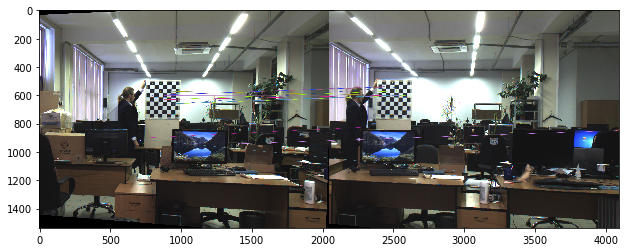

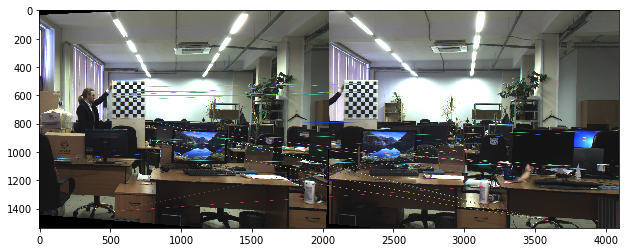

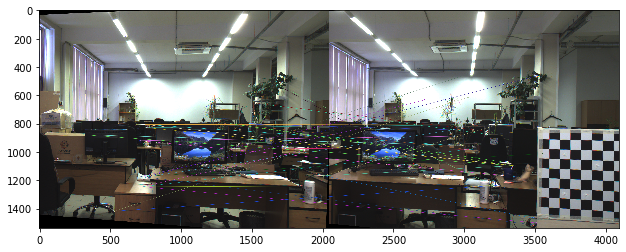

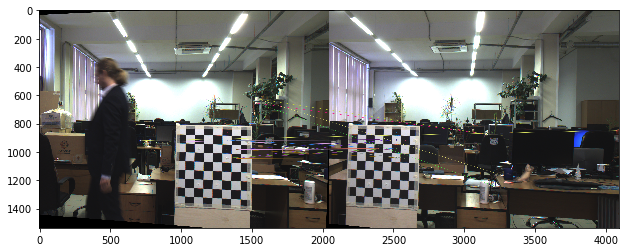

KeyboardInterrupt: 

In [15]:
for imgLeft, imgRight in zip(imagesLeft, imagesRight):

    imgL = cv.imread(imgLeft)
    imgR = cv.imread(imgRight)

    left_nice= cv.remap(imgL, stereoMapL[0], stereoMapL[1], cv.INTER_LANCZOS4, cv.BORDER_CONSTANT, 0)
    right_nice= cv.remap(imgR, stereoMapR[0], stereoMapR[1], cv.INTER_LANCZOS4, cv.BORDER_CONSTANT, 0)
    
    rgbL = cv.cvtColor(left_nice, cv.COLOR_BGR2RGB)
    rgbR = cv.cvtColor(right_nice, cv.COLOR_BGR2RGB)
    
    kp1, des1 = extract_features_orb(rgbL)
    kp2, des2 = extract_features_orb(rgbR)

    match = match_features_bf(des1, des2)
    image_matches = cv.drawMatchesKnn(rgbL, kp1, rgbR, kp2, match[:n], None, flags=2)

    # Draw and display the corners
    fig = plt.figure(figsize=(12, 8))
    plt.imshow(image_matches)
    plt.show()
    cv.waitKey(1000)

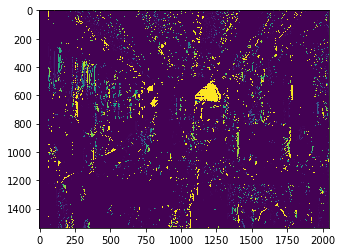

In [10]:
# Setting parameters for StereoSGBM algorithm
minDisparity = 0;
numDisparities = 64;
blockSize = 8;
disp12MaxDiff = 1;
uniquenessRatio = 10;
speckleWindowSize = 10;
speckleRange = 8;

# Creating an object of StereoSGBM algorithm
stereo = cv.StereoSGBM_create(minDisparity = minDisparity,
        numDisparities = numDisparities,
        blockSize = blockSize,
        disp12MaxDiff = disp12MaxDiff,
        uniquenessRatio = uniquenessRatio,
        speckleWindowSize = speckleWindowSize,
        speckleRange = speckleRange
    )

# Calculating disparith using the StereoSGBM algorithm
disp = stereo.compute(imgL, imgR).astype(np.float32)
disp = cv.normalize(disp,0,255,cv.NORM_MINMAX)

# Displaying the disparity map
plt.imshow(disp)

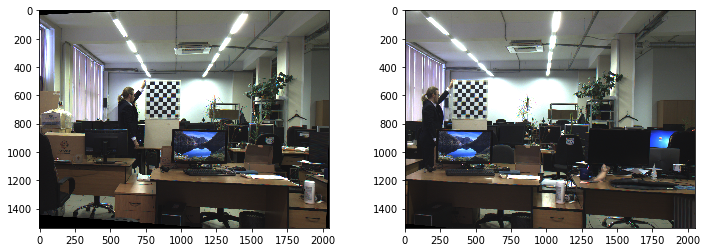

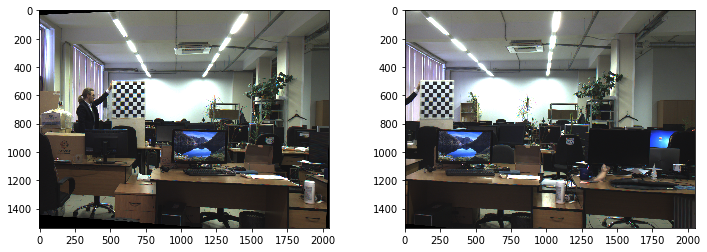

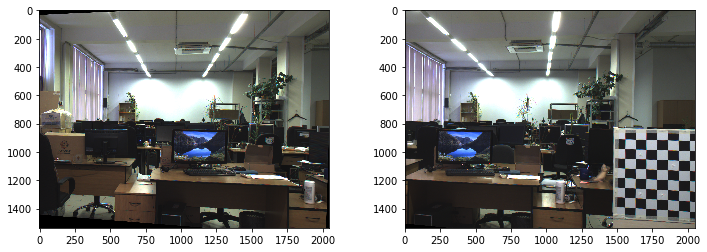

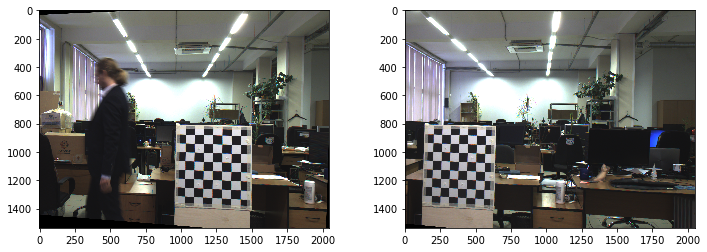

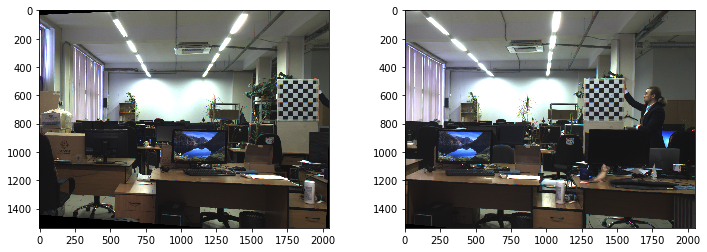

...

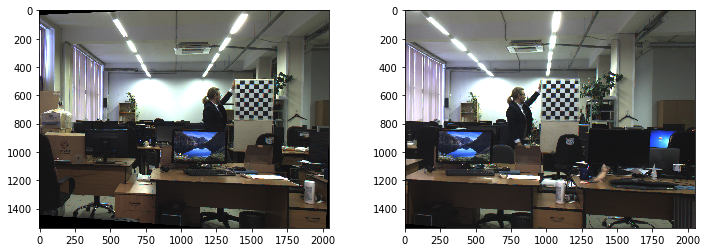

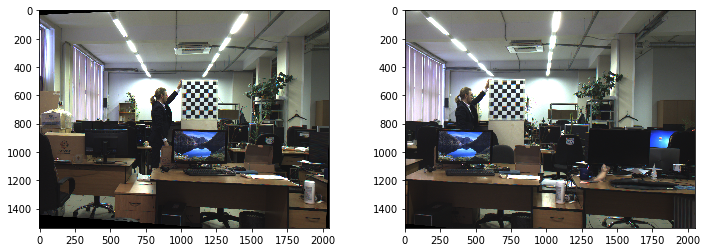

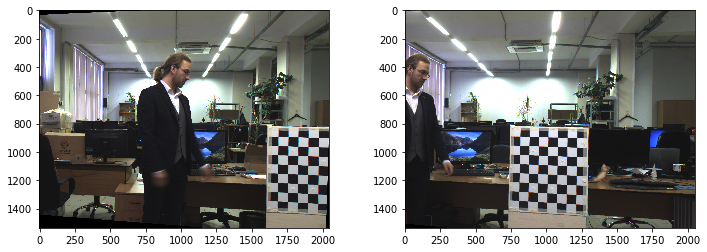

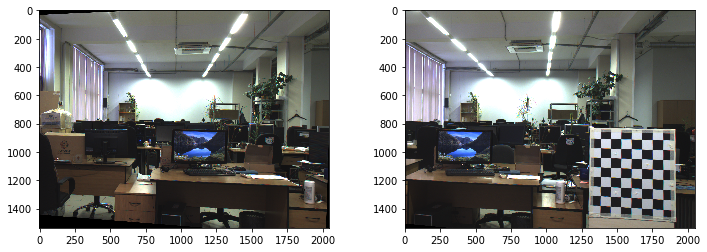

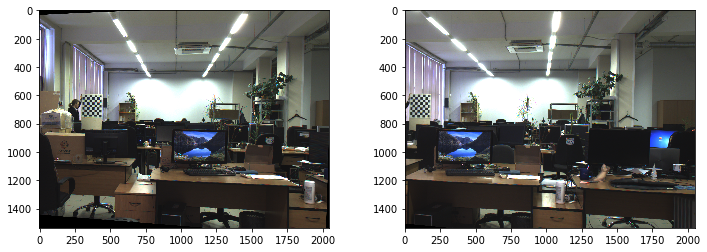

In [20]:
for imgLeft, imgRight in zip(imagesLeft, imagesRight):

    imgL = cv.imread(imgLeft)
    imgR = cv.imread(imgRight)

    left_nice= cv.remap(imgL, stereoMapL[0], stereoMapL[1], cv.INTER_LANCZOS4, cv.BORDER_CONSTANT, 0)
    right_nice= cv.remap(imgR, stereoMapR[0], stereoMapR[1], cv.INTER_LANCZOS4, cv.BORDER_CONSTANT, 0)
    
    rgbL = cv.cvtColor(left_nice, cv.COLOR_BGR2RGB)
    rgbR = cv.cvtColor(right_nice, cv.COLOR_BGR2RGB)
    
    # Draw and display the corners
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    ax1.imshow(rgbL)
    ax2.imshow(rgbR)
    plt.show()
    cv.waitKey(1000)

In [17]:
mean_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv.projectPoints(objpoints[i], rvecsL[i], tvecsL[i], cameraMatrixL, distL)
    error = cv.norm(imgpointsL[i], imgpoints2, cv.NORM_L2)/len(imgpoints2)
    mean_error += error
print( "total error: {}".format(mean_error/len(objpoints)) )

total error: 0.02093477887139918
